# Import dependencies

In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense, Flatten, BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
import pickle
import time
import os
from sklearn.metrics import mean_absolute_error

# Set training environment variables

In [2]:
# images properties
WIDTH = 96
HEIGHT = 96
CHANELS = 3
IMAGE_SHAPE = (HEIGHT, WIDTH, CHANELS)

# training set properties
BUFFER_SIZE = 160 # len of training set
BATCH_SIZE = 16
SEED_SIZE = 100

# image printing properties
ROWS = 5
COLS = 5

# training properties
START_EPOCH = 0
NUM_EPOCHS = 1500

# Read one image

In [3]:
# image_path = os.path.join(os.getcwd(),'Bary_65.png')
# image_path

In [4]:
# copy the same image n time
# images=[Image.open(image_path).convert("RGB") for _ in range(160)]
# len(images)

In [5]:
# look on the size of images
# images[0].size

# Read all images

In [6]:
def read_images(dir_path):
    ''' read each datasets from dir and put everything on the list '''
    images = []
    for image in os.listdir(dir_path):
        images.append(Image.open(os.path.join(dir_path ,image)).convert("RGB"))
    return images

image_dir = os.path.join(os.getcwd(),'Faces_PNG')
image_dir

images = read_images(image_dir)
# look at the size of training set
print(len(images))

# look on the size of images
images[0].size

399


(48, 43)

# Crop images to size (96 x 96)

In [7]:
images = [img.resize( (HEIGHT, WIDTH),Image.ANTIALIAS) for img in images]
# look on the size of resized images
images[0].size

(96, 96)

# Show orginal image

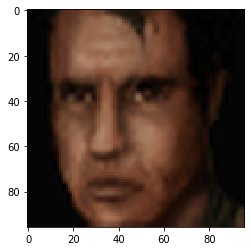

In [8]:
plt.imshow(images[0])

# Convert images to arrays

In [9]:
images = np.array([np.asarray(img) for img in images], dtype='float32')
images[0].shape

(96, 96, 3)

# Normalize the images to the range(-1,1)

In [10]:
def norm(square):
    return (square-127.5)/127.5

def denorm(square):
    return square*127.5+127.5

In [11]:
# normalize the images
images=norm(images).astype('float32')

# Shuffle images 

In [12]:
# shuffle train images
np.random.shuffle(images)

# Split images to train, test set

In [13]:
train_images, test_images = images[:-25], images[-25:]
train_images.shape, test_images.shape

((374, 96, 96, 3), (25, 96, 96, 3))

# Create AutoEncoder

In [14]:
model = Sequential()

# encoder
model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=IMAGE_SHAPE, padding="same"))
model.add(LeakyReLU(alpha=0.2))

model.add(Dropout(0.25))
model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
model.add(ZeroPadding2D(padding=((0,1),(0,1))))
model.add(BatchNormalization(momentum=0.8))
model.add(LeakyReLU(alpha=0.2))

model.add(Dropout(0.25))
model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(LeakyReLU(alpha=0.2))

model.add(Dropout(0.25))
model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(LeakyReLU(alpha=0.2))

model.add(Dropout(0.25))
model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(LeakyReLU(alpha=0.2))

model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(100))

# decoder
model.add(Dense(4*4*256,activation="relu"))
model.add(Reshape((4,4,256))) # output tensor 4,4,256

# upsampling to 8,8,256
model.add(UpSampling2D())
model.add(Conv2D(256,kernel_size=3,padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(Activation("relu"))

# upsampling to 16,16,256
model.add(UpSampling2D())
model.add(Conv2D(256,kernel_size=3,padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(Activation("relu"))

# Output resolution, additional upsampling
# upsampling to 32,32,128
model.add(UpSampling2D())
model.add(Conv2D(128,kernel_size=3,padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(Activation("relu"))

# upsampling to 96,96,128
model.add(UpSampling2D(size=(3,3)))
model.add(Conv2D(128,kernel_size=3,padding="same"))
model.add(BatchNormalization(momentum=0.8))
model.add(Activation("relu"))

# Final CNN layer
# 3 for 3 RGB channels, final output 96,96,3
model.add(Conv2D(3, kernel_size=3,padding="same"))
model.add(Activation("tanh"))

model.compile(loss='mae', optimizer=tf.keras.optimizers.Adam(1.5e-4,0.5))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 48, 48, 32)        896       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 48, 48, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 25, 25, 64)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 25, 25, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 25, 25, 64)        0

In [15]:
# model.fit(images, images, batch_size=16, epochs=50)

# Create function to print and save generated images after particular number of epochs 

Epoch 1, loss 0.6871501207351685


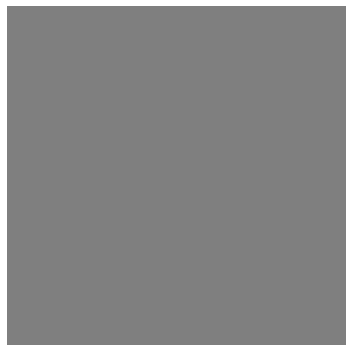

In [16]:
def print_fake_images(model, X_train, rows, cols, epoch, img_dir='Generated_Images', verbose=1):
    
    ''' Generated images'''
    plt.figure(figsize=(rows, cols))
    gs1 = gs.GridSpec(rows, cols)
    gs1.update(wspace=0, hspace=0)
    generated_images = model.predict(X_train)

    print(f'Epoch {epoch+1}, loss {mean_absolute_error(X_train.flatten(), generated_images.flatten())}')
    
    for i in range(rows*cols):
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        image = generated_images[i]
        image = denorm(image).astype('int')
        fig = plt.imshow(image)
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
        
    plt.tight_layout()
    
    if verbose:
        plt.show()

# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)        
        
# test this function
print_fake_images(model,images, 5, 5, 0)

# Train loop

Epoch 1, loss 0.20746159553527832


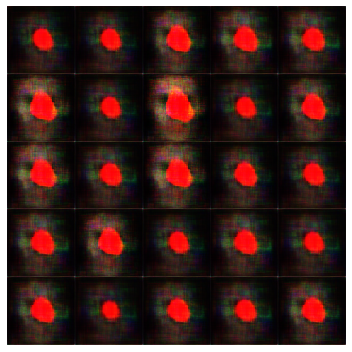

Epoch 11, loss 0.11089332401752472


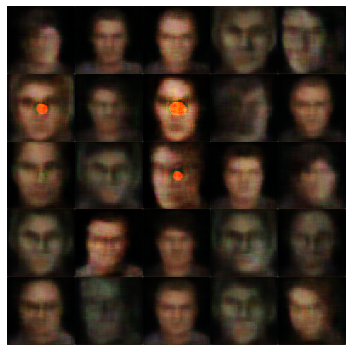

Epoch 21, loss 0.09501728415489197


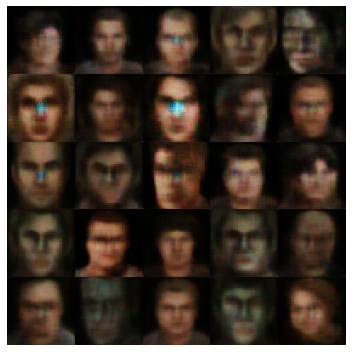

Epoch 31, loss 0.07930625230073929


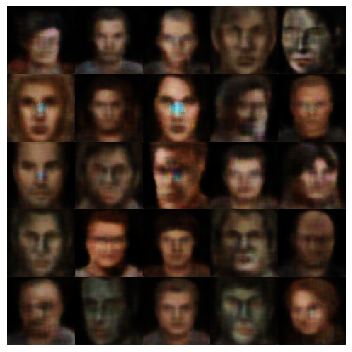

Epoch 41, loss 0.07130391895771027


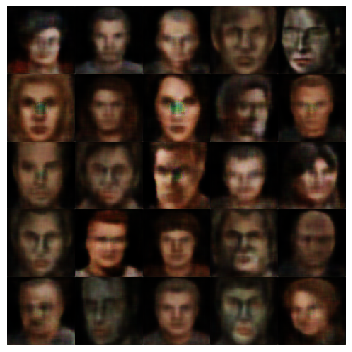

Epoch 51, loss 0.06433357298374176


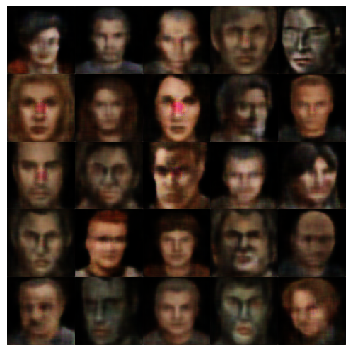

Epoch 61, loss 0.06602472066879272


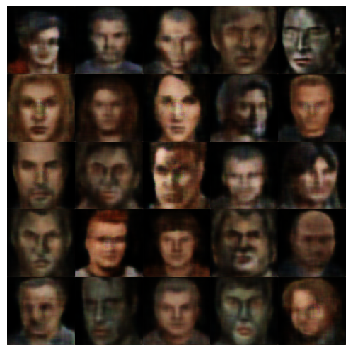

Epoch 71, loss 0.05697430670261383


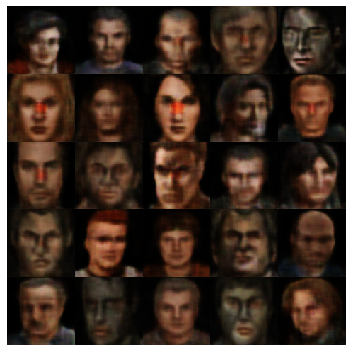

Epoch 81, loss 0.06226089596748352


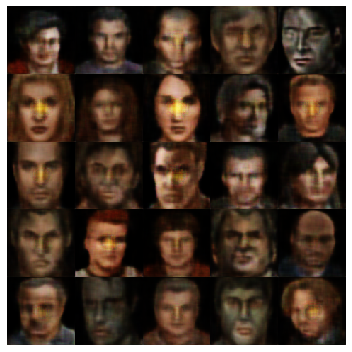

Epoch 91, loss 0.055149808526039124


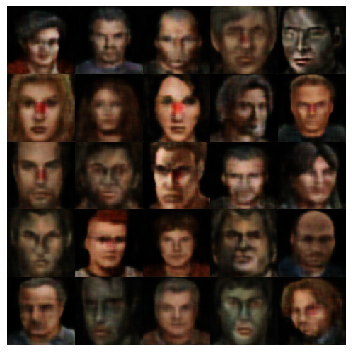

Epoch 101, loss 0.048863667994737625


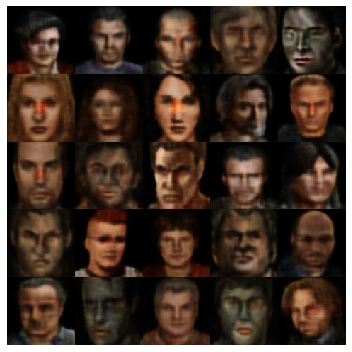

Epoch 111, loss 0.052677370607852936


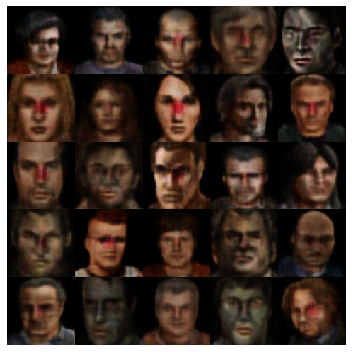

Epoch 121, loss 0.05338926240801811


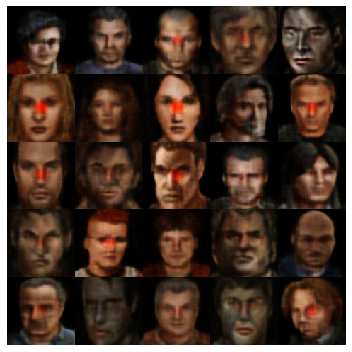

Epoch 131, loss 0.04522957280278206


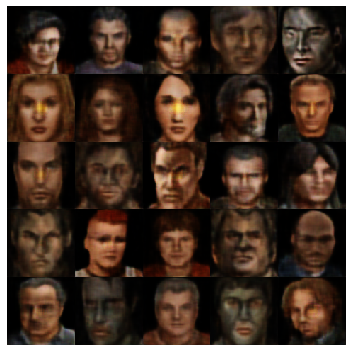

Epoch 141, loss 0.045025166124105453


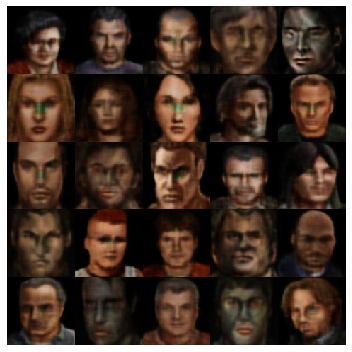

Epoch 151, loss 0.04275066405534744


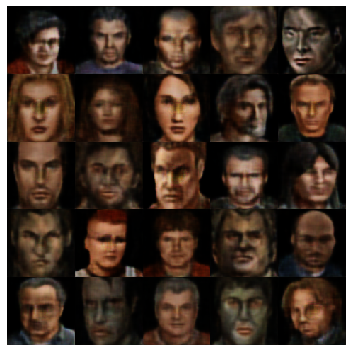

Epoch 161, loss 0.04121587052941322


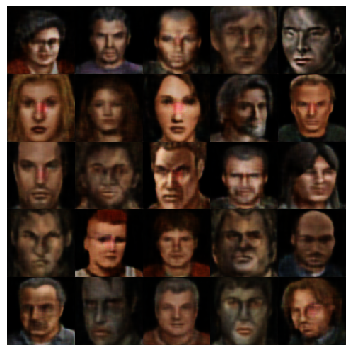

Epoch 171, loss 0.043976277112960815


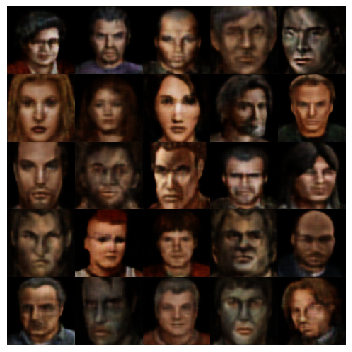

Epoch 181, loss 0.04375351592898369


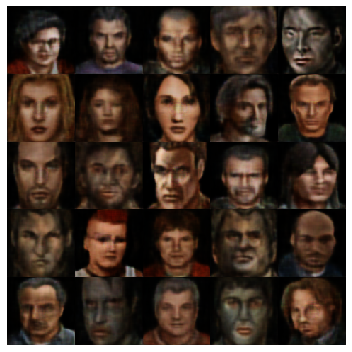

Epoch 191, loss 0.03870169445872307


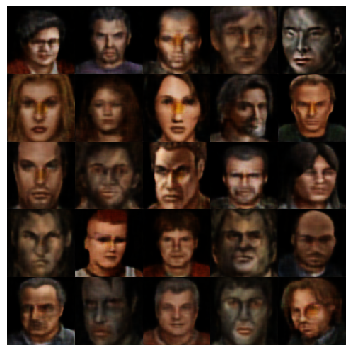

Epoch 201, loss 0.03891691938042641


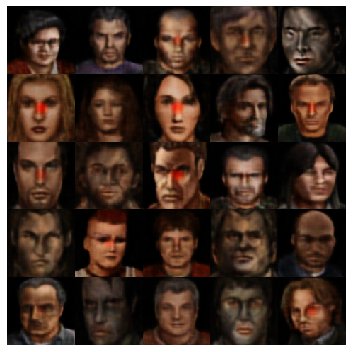

Epoch 211, loss 0.03871900588274002


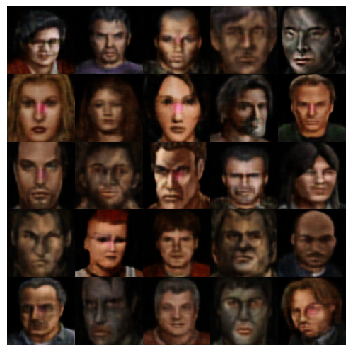

Epoch 221, loss 0.033892907202243805


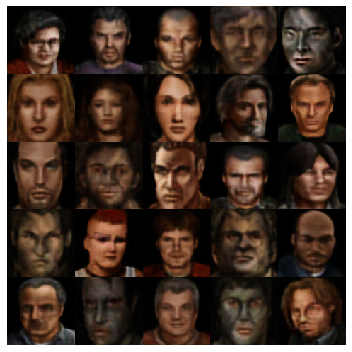

Epoch 231, loss 0.0348532535135746


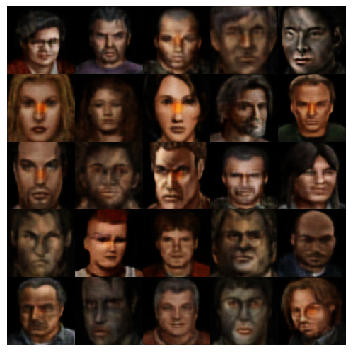

Epoch 241, loss 0.03588821738958359


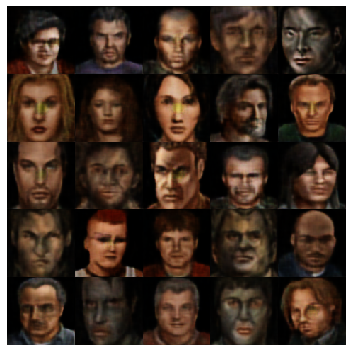

Epoch 251, loss 0.03662585839629173


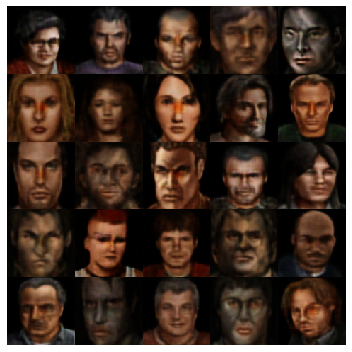

Epoch 261, loss 0.03539596125483513


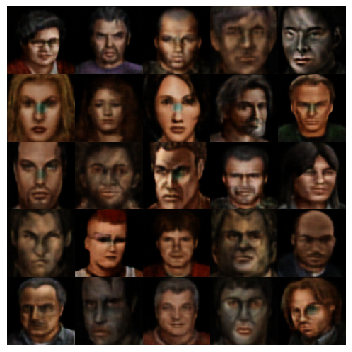

Epoch 271, loss 0.036448653787374496


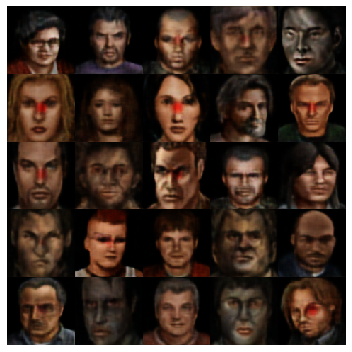

Epoch 281, loss 0.03386898338794708


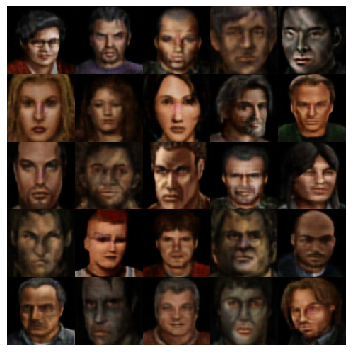

Epoch 291, loss 0.03240995481610298


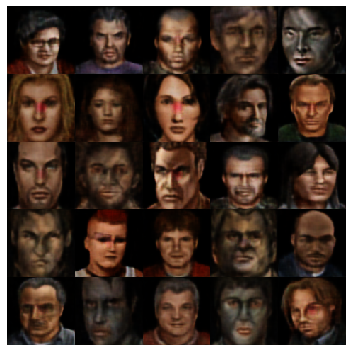

Epoch 301, loss 0.03444267064332962


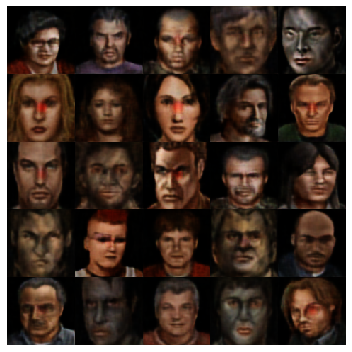

Epoch 311, loss 0.031983632594347


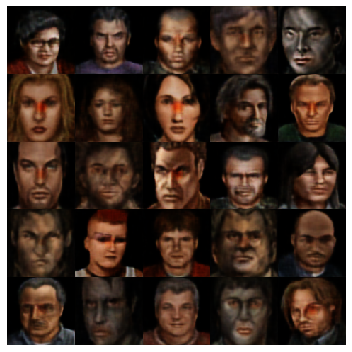

Epoch 321, loss 0.03285794332623482


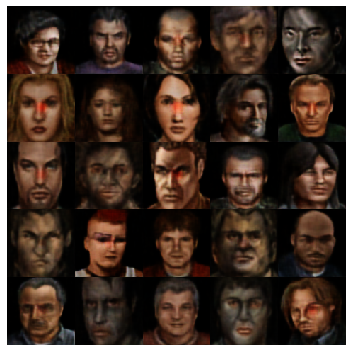

Epoch 331, loss 0.031282998621463776


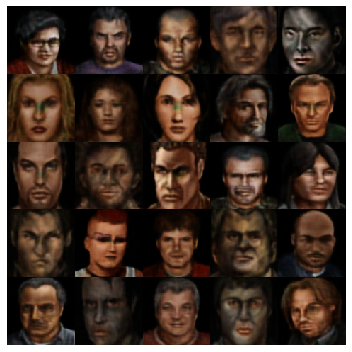

Epoch 341, loss 0.031504400074481964


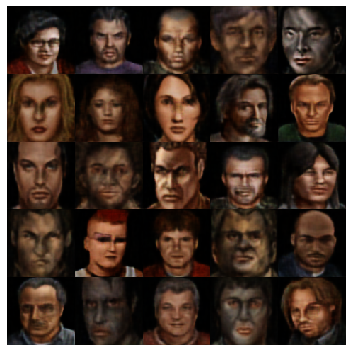

Epoch 351, loss 0.03333045542240143


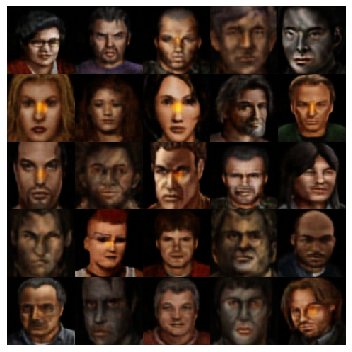

Epoch 361, loss 0.031089941039681435


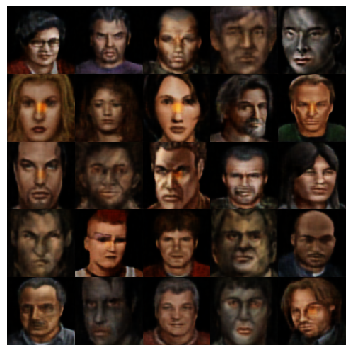

Epoch 371, loss 0.030396968126296997


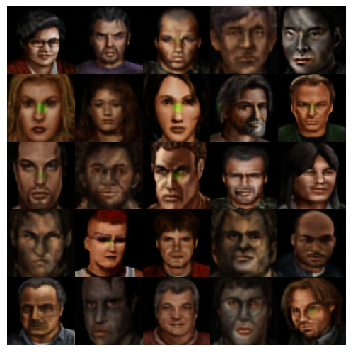

Epoch 381, loss 0.029170693829655647


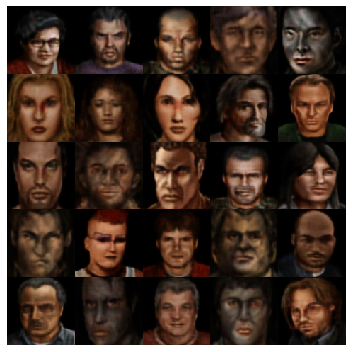

Epoch 391, loss 0.0294207651168108


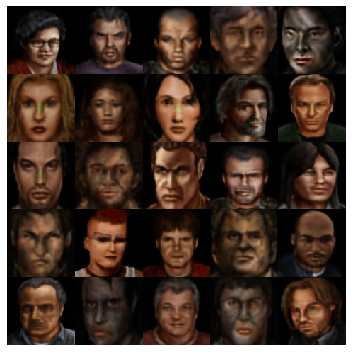

In [17]:
EPOCHS = 400
for epoch in range(EPOCHS):
    model.fit(train_images, train_images, batch_size=16, verbose=0)
    if epoch % 10 == 0:
        print_fake_images(model, train_images, 5, 5, epoch)

# Test Autoencoder

In [18]:
def print_real_images(images, rows, cols):
    
    ''' Generated images'''
    plt.figure(figsize=(rows, cols))
    gs1 = gs.GridSpec(rows, cols)
    gs1.update(wspace=0, hspace=0)
    
    for i in range(rows*cols):
        ax1 = plt.subplot(gs1[i])
        ax1.set_aspect('equal')
        image = images[i]
        image = denorm(image).astype('int')
        fig = plt.imshow(image)
        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)
        
    plt.tight_layout()
    plt.show()

# Print real images

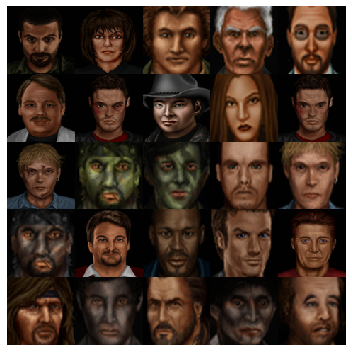

In [19]:
print_real_images(test_images, ROWS, COLS)

# Print fake images

Epoch 1, loss 0.07626648247241974


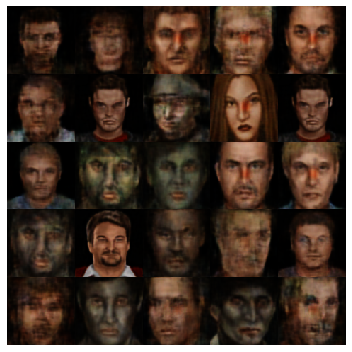

In [20]:
print_fake_images(model, test_images, ROWS, COLS, 0)